### **YOLO11**

###**Dataset Upload**

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving underwater.zip to underwater.zip


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 15.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 65.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 61.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 44.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 80.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

In [ ]:
!unzip /content/underwater.zip -d /content/underwater

Archive:  /content/underwater.zip
  inflating: /content/underwater/aquarium_pretrain/README.dataset.txt  
  inflating: /content/underwater/aquarium_pretrain/README.roboflow.txt  
  inflating: /content/underwater/aquarium_pretrain/data.yaml  
  inflating: /content/underwater/aquarium_pretrain/test/images/IMG_2289_jpeg_jpg.rf.fe2a7a149e7b11f2313f5a7b30386e85.jpg  
  inflating: /content/underwater/aquarium_pretrain/test/images/IMG_2301_jpeg_jpg.rf.2c19ae5efbd1f8611b5578125f001695.jpg  
  inflating: /content/underwater/aquarium_pretrain/test/images/IMG_2319_jpeg_jpg.rf.6e20bf97d17b74a8948aa48776c40454.jpg  
  inflating: /content/underwater/aquarium_pretrain/test/images/IMG_2347_jpeg_jpg.rf.7c71ac4b9301eb358cd4a832844dedcb.jpg  
  inflating: /content/underwater/aquarium_pretrain/test/images/IMG_2354_jpeg_jpg.rf.396e872c7fb0a95e911806986995ee7a.jpg  
  inflating: /content/underwater/aquarium_pretrain/test/images/IMG_2371_jpeg_jpg.rf.54505f60b6706da151c164188c305849.jpg  
  inflating: /conten

In [ ]:

import zipfile
import os

zip_path = '/content/underwater.zip'
extract_path = '/content/underwater'
os.makedirs(extract_path, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print(f"Extracted to: {extract_path}")

Extracted to: /content/underwater


In [ ]:
import yaml

data_yaml_path = '/content/underwater/aquarium_pretrain/data.yaml'
with open(data_yaml_path, 'r') as file:
    data_yaml = yaml.safe_load(file)


data_yaml['train'] = '/content/underwater/aquarium_pretrain/train/images'
data_yaml['val'] = '/content/underwater/aquarium_pretrain/valid/images'
data_yaml['test'] = '/content/underwater/aquarium_pretrain/test/images'

expected_classes = ['fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray']
if data_yaml['names'] != expected_classes:
    print("Warning: Class names in data.yaml may not match expected classes.")
    data_yaml['names'] = expected_classes
    data_yaml['nc'] = len(expected_classes)


with open(data_yaml_path, 'w') as file:
    yaml.safe_dump(data_yaml, file)

print("Updated data.yaml:")
print(data_yaml)

Updated data.yaml:
{'train': '/content/underwater/aquarium_pretrain/train/images', 'val': '/content/underwater/aquarium_pretrain/valid/images', 'nc': 7, 'names': ['fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray'], 'test': '/content/underwater/aquarium_pretrain/test/images'}


In [ ]:
print("Train images:", len(os.listdir('/content/underwater/aquarium_pretrain/train/images')))
print("Train labels:", len(os.listdir('/content/underwater/aquarium_pretrain/train/labels')))
print("Valid images:", len(os.listdir('/content/underwater/aquarium_pretrain/valid/images')))
print("Valid labels:", len(os.listdir('/content/underwater/aquarium_pretrain/valid/labels')))

Train images: 448
Train labels: 448
Valid images: 127
Valid labels: 127


In [ ]:
import torch
print("CUDA Available:", torch.cuda.is_available())
print("Device Count:", torch.cuda.device_count())
print("Current Device:", torch.cuda.current_device() if torch.cuda.is_available() else "No GPU")

CUDA Available: False
Device Count: 0
Current Device: No GPU


### **Training YOLO**

Extracted to: /content/underwater
Updated data.yaml: {'train': '/content/underwater/aquarium_pretrain/train/images', 'val': '/content/underwater/aquarium_pretrain/valid/images', 'nc': 7, 'names': ['fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray'], 'test': '/content/underwater/aquarium_pretrain/test/images'}
Train images: 448
Train labels: 448
Valid images: 127
Valid labels: 127
Test images: 63
Test labels: 63
Using device: cpu
Ultralytics 8.3.121 🚀 Python-3.11.12 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/underwater/aquarium_pretrain/data.yaml, epochs=30, time=None, patience=15, batch=8, imgsz=416, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=underwater_yolo11, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profi

100%|██████████| 755k/755k [00:00<00:00, 13.7MB/s]

Overriding model.yaml nc=80 with nc=7

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     


  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  8                  -1  1    346112  ultralytics.nn.modules.block.C3k2            [256, 256, 1, True]           
  9                  -1  1    164608  ultralytics.nn.modules.block.SPPF            [256, 256, 5]                 
 10                  -1  1    249728  ultralytics.nn.modules.block.C2PSA           [256, 256, 1]                 
 11                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 12             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 13                  -1  1    111296  ultralytics.nn.modules.block.C3k2            [384,

train: Scanning /content/underwater/aquarium_pretrain/train/labels... 448 images, 1 backgrounds, 0 corrupt: 100%|██████████| 448/448 [00:00<00:00, 743.32it/s]


train: New cache created: /content/underwater/aquarium_pretrain/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1153.7±375.3 MB/s, size: 97.4 KB)


val: Scanning /content/underwater/aquarium_pretrain/valid/labels... 127 images, 0 backgrounds, 0 corrupt: 100%|██████████| 127/127 [00:00<00:00, 1930.21it/s]

val: New cache created: /content/underwater/aquarium_pretrain/valid/labels.cache


Plotting labels to runs/detect/underwater_yolo11/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 416 train, 416 val
Using 0 dataloader workers
Logging results to runs/detect/underwater_yolo11
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30         0G       1.64      3.933      1.234         50        416: 100%|██████████| 56/56 [02:56<00:00,  3.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:19<00:00,  2.44s/it]

                   all        127        909     0.0075      0.391     0.0583     0.0326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30         0G      1.811      3.163      1.254         60        416: 100%|██████████| 56/56 [02:52<00:00,  3.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:18<00:00,  2.32s/it]

                   all        127        909      0.377      0.159      0.179     0.0852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30         0G      1.806      2.643      1.281         80        416: 100%|██████████| 56/56 [02:52<00:00,  3.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:17<00:00,  2.19s/it]

                   all        127        909      0.552      0.236      0.225      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30         0G      1.808      2.417      1.289        111        416: 100%|██████████| 56/56 [02:54<00:00,  3.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:19<00:00,  2.41s/it]

                   all        127        909      0.397      0.327      0.277      0.137



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30         0G      1.777      2.151      1.253         99        416: 100%|██████████| 56/56 [02:51<00:00,  3.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:18<00:00,  2.29s/it]

                   all        127        909      0.372      0.403      0.338      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30         0G      1.712       2.06      1.241        140        416: 100%|██████████| 56/56 [02:52<00:00,  3.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:17<00:00,  2.18s/it]

                   all        127        909      0.326      0.442      0.319      0.152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30         0G      1.699      1.994       1.25         84        416: 100%|██████████| 56/56 [02:53<00:00,  3.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:18<00:00,  2.29s/it]

                   all        127        909      0.482      0.391      0.392       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30         0G      1.645      1.964      1.245        158        416: 100%|██████████| 56/56 [02:51<00:00,  3.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:17<00:00,  2.18s/it]

                   all        127        909      0.415      0.395      0.378      0.191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30         0G      1.667      1.773       1.23         82        416: 100%|██████████| 56/56 [02:53<00:00,  3.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:18<00:00,  2.30s/it]

                   all        127        909      0.441      0.492      0.475      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30         0G      1.663      1.818      1.213        108        416: 100%|██████████| 56/56 [02:55<00:00,  3.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:18<00:00,  2.31s/it]

                   all        127        909      0.518      0.483      0.459      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30         0G      1.602      1.747      1.221        122        416: 100%|██████████| 56/56 [02:49<00:00,  3.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:18<00:00,  2.27s/it]

                   all        127        909      0.617      0.489      0.515      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30         0G      1.602      1.701      1.201         73        416: 100%|██████████| 56/56 [02:51<00:00,  3.06s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:18<00:00,  2.25s/it]

                   all        127        909      0.663      0.479      0.543      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30         0G      1.619      1.676      1.206         93        416: 100%|██████████| 56/56 [02:52<00:00,  3.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:17<00:00,  2.18s/it]

                   all        127        909      0.604      0.496      0.532      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30         0G       1.56      1.572      1.178        110        416: 100%|██████████| 56/56 [02:53<00:00,  3.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:17<00:00,  2.14s/it]

                   all        127        909      0.641       0.47      0.535      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30         0G      1.553      1.576      1.187         84        416: 100%|██████████| 56/56 [02:52<00:00,  3.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:18<00:00,  2.28s/it]

                   all        127        909      0.653      0.504      0.561      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30         0G      1.501      1.535       1.17        133        416: 100%|██████████| 56/56 [02:52<00:00,  3.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:18<00:00,  2.31s/it]

                   all        127        909      0.655      0.528      0.591      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30         0G      1.493      1.498      1.172         88        416: 100%|██████████| 56/56 [02:52<00:00,  3.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:17<00:00,  2.16s/it]

                   all        127        909      0.727      0.524      0.603      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30         0G      1.508       1.47      1.153         86        416: 100%|██████████| 56/56 [02:53<00:00,  3.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:16<00:00,  2.11s/it]

                   all        127        909      0.701      0.548      0.607       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30         0G      1.515      1.434       1.16         57        416: 100%|██████████| 56/56 [02:53<00:00,  3.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:17<00:00,  2.20s/it]

                   all        127        909      0.734      0.562      0.629      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30         0G      1.477      1.386      1.143        121        416: 100%|██████████| 56/56 [02:53<00:00,  3.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:18<00:00,  2.27s/it]

                   all        127        909      0.729      0.573      0.644      0.349


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30         0G      1.429      1.481      1.129         63        416: 100%|██████████| 56/56 [02:49<00:00,  3.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:17<00:00,  2.19s/it]

                   all        127        909      0.648      0.542      0.602      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30         0G      1.393      1.424      1.118         59        416: 100%|██████████| 56/56 [02:49<00:00,  3.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:17<00:00,  2.13s/it]

                   all        127        909      0.673      0.563      0.617      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30         0G      1.404      1.343       1.11         69        416: 100%|██████████| 56/56 [02:48<00:00,  3.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:16<00:00,  2.12s/it]

                   all        127        909       0.66      0.588      0.634      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30         0G      1.354        1.3      1.101         35        416: 100%|██████████| 56/56 [02:47<00:00,  2.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:17<00:00,  2.19s/it]

                   all        127        909      0.704      0.577      0.644      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30         0G       1.35      1.276      1.099         23        416: 100%|██████████| 56/56 [02:47<00:00,  2.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:16<00:00,  2.08s/it]

                   all        127        909      0.708      0.598      0.656      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30         0G      1.337      1.256      1.084         49        416: 100%|██████████| 56/56 [02:47<00:00,  2.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:17<00:00,  2.18s/it]

                   all        127        909      0.745      0.578       0.66      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30         0G       1.33      1.232      1.077         41        416: 100%|██████████| 56/56 [02:47<00:00,  2.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:18<00:00,  2.27s/it]

                   all        127        909      0.745      0.576      0.661      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30         0G      1.348      1.218      1.074         48        416: 100%|██████████| 56/56 [02:47<00:00,  2.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:18<00:00,  2.30s/it]

                   all        127        909      0.713      0.618      0.668       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30         0G      1.321      1.205      1.084         66        416: 100%|██████████| 56/56 [02:47<00:00,  2.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:17<00:00,  2.19s/it]

                   all        127        909      0.734      0.616      0.682       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30         0G      1.312      1.181      1.057         57        416: 100%|██████████| 56/56 [02:47<00:00,  2.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:16<00:00,  2.11s/it]

                   all        127        909      0.693       0.63      0.674       0.38



30 epochs completed in 1.579 hours.
Optimizer stripped from runs/detect/underwater_yolo11/weights/last.pt, 5.4MB
Optimizer stripped from runs/detect/underwater_yolo11/weights/best.pt, 5.4MB

Validating runs/detect/underwater_yolo11/weights/best.pt...
Ultralytics 8.3.121 🚀 Python-3.11.12 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:16<00:00,  2.12s/it]


                   all        127        909      0.735      0.615      0.682       0.38
                  fish         63        459      0.824      0.599      0.748      0.387
             jellyfish          9        155      0.701      0.858      0.844      0.438
               penguin         17        104      0.592      0.571      0.591      0.237
                puffin         15         74      0.531      0.473      0.487      0.191
                 shark         28         57      0.782      0.544      0.629      0.374
              starfish         17         27       0.81      0.593      0.704      0.504
              stingray         23         33      0.907      0.667      0.772      0.531
Speed: 1.1ms preprocess, 105.5ms inference, 0.0ms loss, 4.5ms postprocess per image
Results saved to runs/detect/underwater_yolo11
Ultralytics 8.3.121 🚀 Python-3.11.12 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradients, 6.3 G

val: Scanning /content/underwater/aquarium_pretrain/valid/labels.cache... 127 images, 0 backgrounds, 0 corrupt: 100%|██████████| 127/127 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:13<00:00,  1.15it/s]


                   all        127        909      0.745      0.613      0.685      0.381
                  fish         63        459      0.832       0.59      0.747      0.387
             jellyfish          9        155      0.729      0.865      0.853      0.435
               penguin         17        104      0.605      0.558      0.594      0.238
                puffin         15         74      0.535      0.473      0.489      0.192
                 shark         28         57      0.786      0.544      0.636      0.377
              starfish         17         27      0.812      0.593      0.704      0.504
              stingray         23         33      0.914      0.667      0.773      0.531
Speed: 0.8ms preprocess, 88.8ms inference, 0.0ms loss, 3.9ms postprocess per image
Results saved to runs/detect/underwater_yolo112
mAP@0.5:0.95: 0.38063389647933255
Sample test images: ['IMG_2532_jpeg_jpg.rf.2afeb76e5d9372dbbd6fbc53d5b75675.jpg', 'IMG_2632_jpeg_jpg.rf.f44037edca490b16cbf

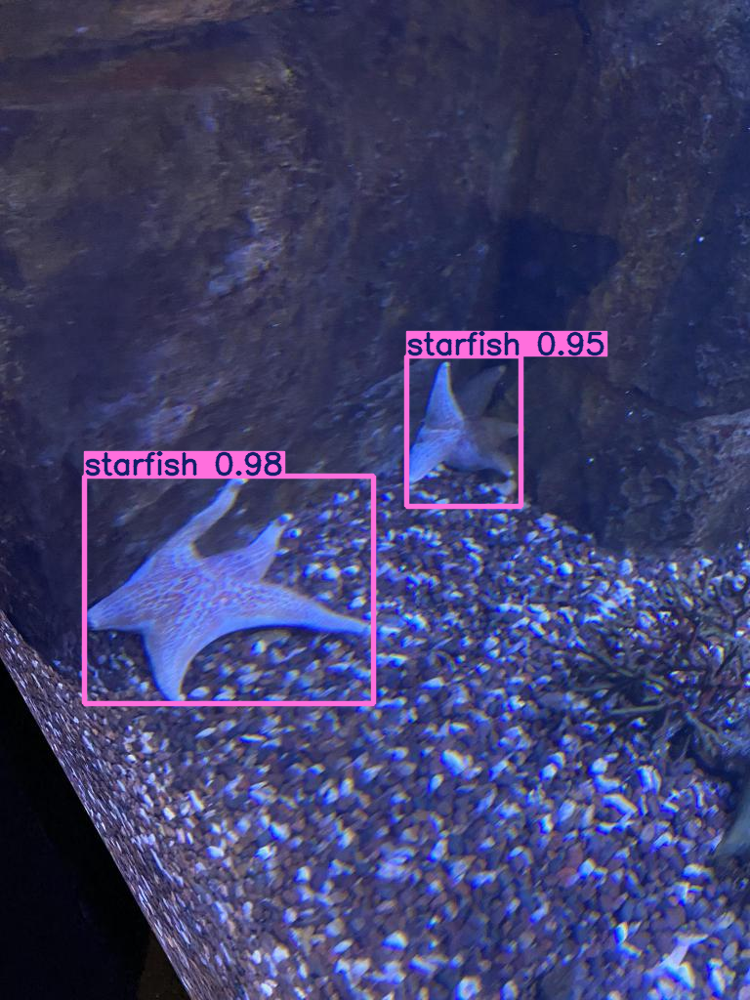


image 1/63 /content/underwater/aquarium_pretrain/test/images/IMG_2289_jpeg_jpg.rf.fe2a7a149e7b11f2313f5a7b30386e85.jpg: 416x320 1 penguin, 1 puffin, 144.8ms
image 2/63 /content/underwater/aquarium_pretrain/test/images/IMG_2301_jpeg_jpg.rf.2c19ae5efbd1f8611b5578125f001695.jpg: 416x320 12 penguins, 141.5ms
image 3/63 /content/underwater/aquarium_pretrain/test/images/IMG_2319_jpeg_jpg.rf.6e20bf97d17b74a8948aa48776c40454.jpg: 416x320 13 penguins, 124.7ms
image 4/63 /content/underwater/aquarium_pretrain/test/images/IMG_2347_jpeg_jpg.rf.7c71ac4b9301eb358cd4a832844dedcb.jpg: 416x320 2 penguins, 104.0ms
image 5/63 /content/underwater/aquarium_pretrain/test/images/IMG_2354_jpeg_jpg.rf.396e872c7fb0a95e911806986995ee7a.jpg: 416x320 6 penguins, 146.7ms
image 6/63 /content/underwater/aquarium_pretrain/test/images/IMG_2371_jpeg_jpg.rf.54505f60b6706da151c164188c305849.jpg: 416x320 4 fishs, 149.7ms
image 7/63 /content/underwater/aquarium_pretrain/test/images/IMG_2379_jpeg_jpg.rf.7dc3160c937072d26d462

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:

import zipfile
import os

zip_path = '/content/underwater.zip'
extract_path = '/content/underwater'
os.makedirs(extract_path, exist_ok=True)
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)
print(f"Extracted to: {extract_path}")

import yaml

data_yaml_path = '/content/underwater/aquarium_pretrain/data.yaml'
with open(data_yaml_path, 'r') as file:
    data_yaml = yaml.safe_load(file)

data_yaml['train'] = '/content/underwater/aquarium_pretrain/train/images'
data_yaml['val'] = '/content/underwater/aquarium_pretrain/valid/images'
data_yaml['test'] = '/content/underwater/aquarium_pretrain/test/images'
expected_classes = ['fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray']
if data_yaml['names'] != expected_classes:
    print("Warning: Class names updated.")
    data_yaml['names'] = expected_classes
    data_yaml['nc'] = len(expected_classes)

with open(data_yaml_path, 'w') as file:
    yaml.safe_dump(data_yaml, file)
print("Updated data.yaml:", data_yaml)


print("Train images:", len(os.listdir('/content/underwater/aquarium_pretrain/train/images')))
print("Train labels:", len(os.listdir('/content/underwater/aquarium_pretrain/train/labels')))
print("Valid images:", len(os.listdir('/content/underwater/aquarium_pretrain/valid/images')))
print("Valid labels:", len(os.listdir('/content/underwater/aquarium_pretrain/valid/labels')))
print("Test images:", len(os.listdir('/content/underwater/aquarium_pretrain/test/images')))
print("Test labels:", len(os.listdir('/content/underwater/aquarium_pretrain/test/labels')))


!pip install ultralytics


from ultralytics import YOLO


device = "cpu"
print(f"Using device: {device}")


model = YOLO("yolo11n.pt")


train_results = model.train(
    data="/content/underwater/aquarium_pretrain/data.yaml",
    epochs=30,
    imgsz=416,
    batch=8,
    device=device,
    patience=15,
    name="underwater_yolo11"
)


metrics = model.val(data="/content/underwater/aquarium_pretrain/data.yaml")
print("mAP@0.5:0.95:", metrics.box.map)

test_images = os.listdir('/content/underwater/aquarium_pretrain/test/images')
print("Sample test images:", test_images[:5])
results = model(f"/content/underwater/aquarium_pretrain/test/images/{test_images[0]}")
results[0].show()

results = model.predict(source="/content/underwater/aquarium_pretrain/test/images", save=True)
print("Batch inference results saved in /content/runs/detect/predict/")


path = model.export(format="onnx")
print(f"Model exported to: {path}")
from google.colab import files
files.download('/content/runs/detect/underwater_yolo11/weights/best.pt')
files.download('/content/runs/detect/underwater_yolo11/results.png')

### **Testing on imgages**

Using device: cpu
Testing on: /content/underwater/aquarium_pretrain/train/images/IMG_2296_jpeg_jpg.rf.56a86afeeeb9a6c12746f77b7346ff19.jpg

image 1/1 /content/underwater/aquarium_pretrain/train/images/IMG_2296_jpeg_jpg.rf.56a86afeeeb9a6c12746f77b7346ff19.jpg: 416x320 2 puffins, 101.0ms
Speed: 5.1ms preprocess, 101.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 320)


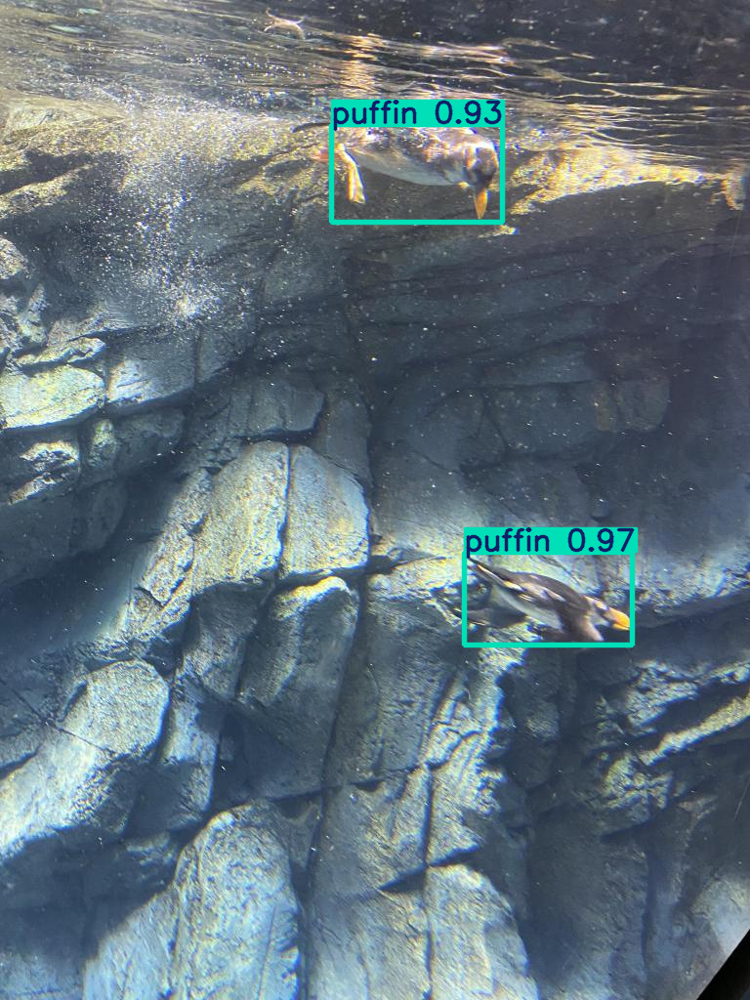

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from ultralytics import YOLO
import os

model_path = '/content/runs/detect/underwater_yolo11/weights/best.pt'
model = YOLO(model_path)

device = "cpu"
print(f"Using device: {device}")
model.to(device)

specific_image = '/content/underwater/aquarium_pretrain/train/images/IMG_2296_jpeg_jpg.rf.56a86afeeeb9a6c12746f77b7346ff19.jpg'  # Replace with your image name
test_images_dir = '/content/underwater/aquarium_pretrain/test/images'
test_image_path = os.path.join(test_images_dir, specific_image)


if os.path.exists(test_image_path):
    print(f"Testing on: {test_image_path}")

    results = model(test_image_path)

    results[0].show()

    results[0].save(filename="test_result.jpg")

    from google.colab import files
    files.download("test_result.jpg")
else:
    print(f"Error: Image {specific_image} not found in {test_images_dir}")

    print("Available test images:", os.listdir(test_images_dir)[:5])

In [ ]:
from ultralytics import YOLO
import os


model_path = '/content/runs/detect/underwater_yolo11/weights/best.pt'
model = YOLO(model_path)


device = "cpu"
print(f"Using device: {device}")
model.to(device)


specific_image = '/content/underwater/aquarium_pretrain/train/images/IMG_2296_jpeg_jpg.rf.56a86afeeeb9a6c12746f77b7346ff19.jpg'  # Replace with your image name
test_images_dir = '/content/underwater/aquarium_pretrain/test/images'
test_image_path = os.path.join(test_images_dir, specific_image)


if os.path.exists(test_image_path):
    print(f"Testing on: {test_image_path}")

    results = model(test_image_path)

    results[0].show()

    results[0].save(filename="test_result.jpg")

    from google.colab import files
    files.download("test_result.jpg")
else:
    print(f"Error: Image {specific_image} not found in {test_images_dir}")

    print("Available test images:", os.listdir(test_images_dir)[:5])

Using device: cpu
Testing on: /content/underwater/aquarium_pretrain/train/images/IMG_2327_jpeg_jpg.rf.23ca4add8919548516415c9fe02eedf6.jpg

image 1/1 /content/underwater/aquarium_pretrain/train/images/IMG_2327_jpeg_jpg.rf.23ca4add8919548516415c9fe02eedf6.jpg: 416x320 2 penguins, 103.3ms
Speed: 3.6ms preprocess, 103.3ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 320)


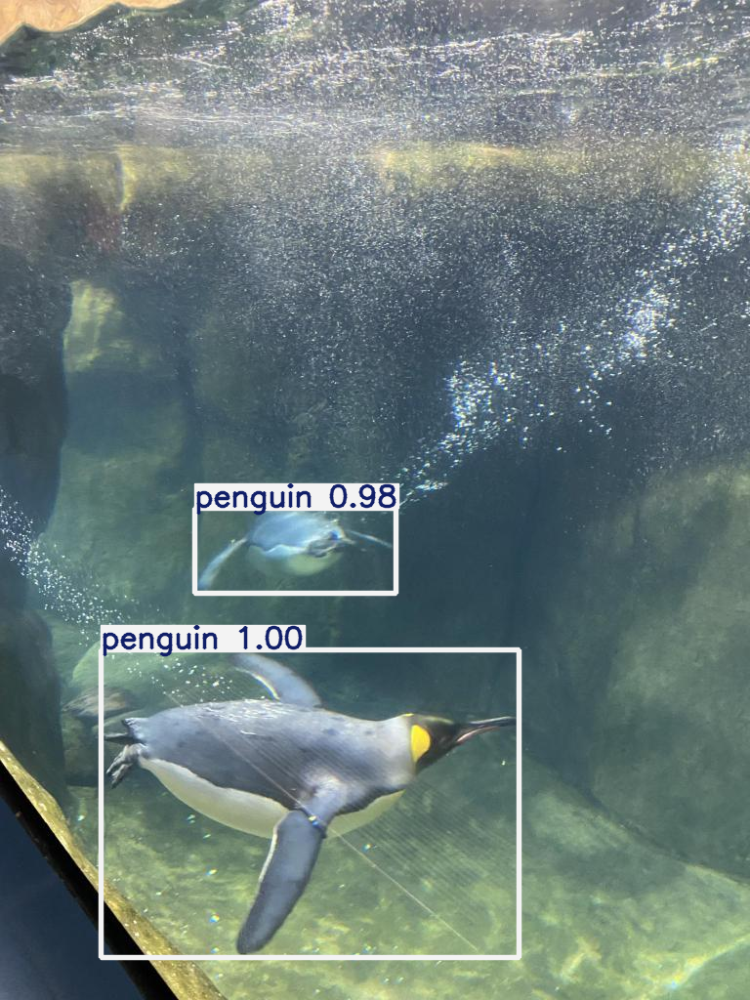

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from ultralytics import YOLO
import os

model_path = '/content/runs/detect/underwater_yolo11/weights/best.pt'
model = YOLO(model_path)

device = "cpu"
print(f"Using device: {device}")
model.to(device)

specific_image = '/content/underwater/aquarium_pretrain/train/images/IMG_2327_jpeg_jpg.rf.23ca4add8919548516415c9fe02eedf6.jpg'  # Replace with your image name
test_images_dir = '/content/underwater/aquarium_pretrain/test/images'
test_image_path = os.path.join(test_images_dir, specific_image)

if os.path.exists(test_image_path):
    print(f"Testing on: {test_image_path}")

    results = model(test_image_path)

    results[0].show()

    results[0].save(filename="test_result.jpg")

    from google.colab import files
    files.download("test_result.jpg")
else:
    print(f"Error: Image {specific_image} not found in {test_images_dir}")

    print("Available test images:", os.listdir(test_images_dir)[:5])

In [ ]:
from ultralytics import YOLO
import os


model_path = '/content/runs/detect/underwater_yolo11/weights/best.pt'
model = YOLO(model_path)

device = "cpu"
print(f"Using device: {device}")
model.to(device)

specific_image = '/content/underwater/aquarium_pretrain/train/images/IMG_2327_jpeg_jpg.rf.23ca4add8919548516415c9fe02eedf6.jpg'  # Replace with your image name
test_images_dir = '/content/underwater/aquarium_pretrain/test/images'
test_image_path = os.path.join(test_images_dir, specific_image)


if os.path.exists(test_image_path):
    print(f"Testing on: {test_image_path}")

    results = model(test_image_path)

    results[0].show()

    results[0].save(filename="test_result.jpg")

    from google.colab import files
    files.download("test_result.jpg")
else:
    print(f"Error: Image {specific_image} not found in {test_images_dir}")

    print("Available test images:", os.listdir(test_images_dir)[:5])

Using device: cpu
Testing on: /content/underwater/aquarium_pretrain/train/images/IMG_3158_jpeg_jpg.rf.0f2bac58bc2e3ca07172215f073a2dab.jpg

image 1/1 /content/underwater/aquarium_pretrain/train/images/IMG_3158_jpeg_jpg.rf.0f2bac58bc2e3ca07172215f073a2dab.jpg: 416x320 4 puffins, 166.6ms
Speed: 7.7ms preprocess, 166.6ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 320)


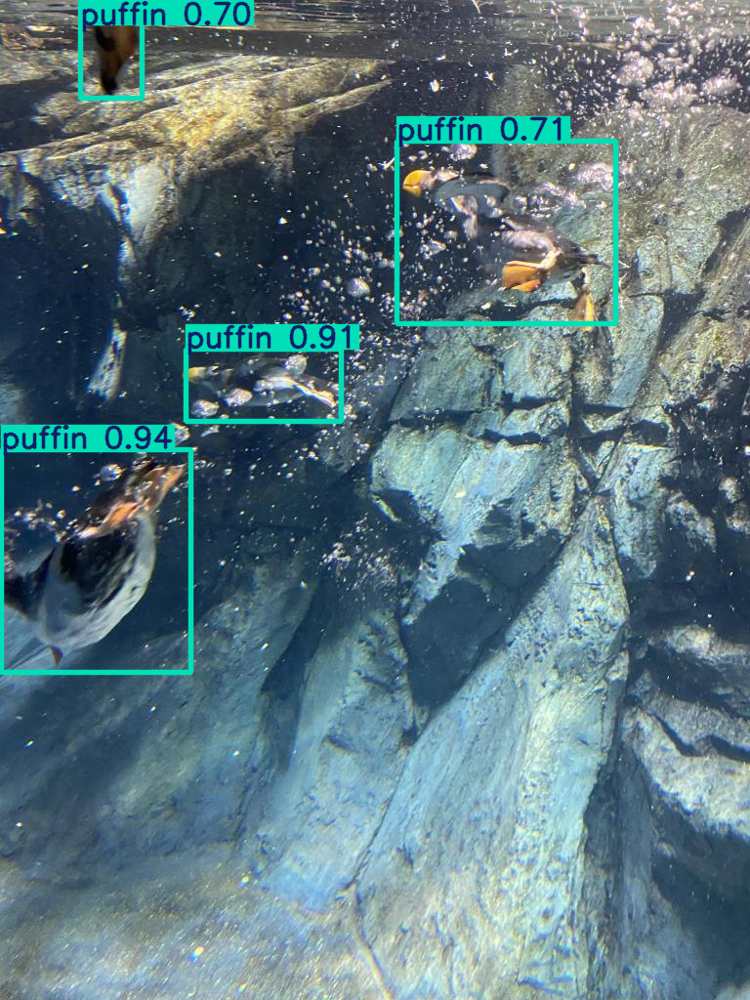

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from ultralytics import YOLO
import os


model_path = '/content/runs/detect/underwater_yolo11/weights/best.pt'
model = YOLO(model_path)


device = "cpu"
print(f"Using device: {device}")
model.to(device)


specific_image = '/content/underwater/aquarium_pretrain/train/images/IMG_3158_jpeg_jpg.rf.0f2bac58bc2e3ca07172215f073a2dab.jpg'  # Replace with your image name
test_images_dir = '/content/underwater/aquarium_pretrain/test/images'
test_image_path = os.path.join(test_images_dir, specific_image)

if os.path.exists(test_image_path):
    print(f"Testing on: {test_image_path}")

    results = model(test_image_path)

    results[0].show()

    results[0].save(filename="test_result.jpg")

    from google.colab import files
    files.download("test_result.jpg")
else:
    print(f"Error: Image {specific_image} not found in {test_images_dir}")
    print("Available test images:", os.listdir(test_images_dir)[:5])

Using device: cpu
Testing on: /content/underwater/aquarium_pretrain/train/images/IMG_8599_MOV-0_jpg.rf.3bd4fd78a244fdb4e48556896c70de74.jpg

image 1/1 /content/underwater/aquarium_pretrain/train/images/IMG_8599_MOV-0_jpg.rf.3bd4fd78a244fdb4e48556896c70de74.jpg: 416x256 7 jellyfishs, 141.8ms
Speed: 4.0ms preprocess, 141.8ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 256)


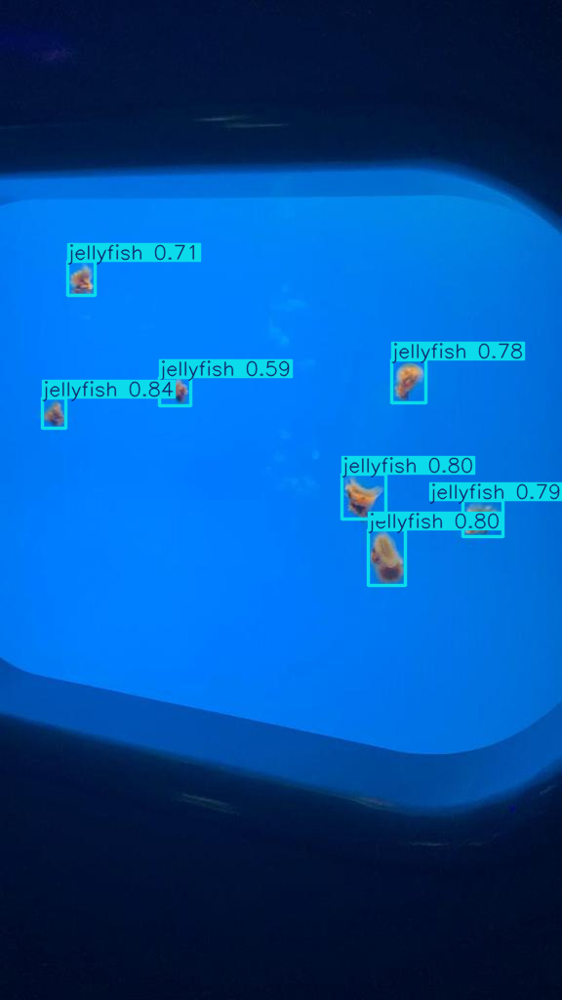

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from ultralytics import YOLO
import os

model_path = '/content/runs/detect/underwater_yolo11/weights/best.pt'
model = YOLO(model_path)

device = "cpu"
print(f"Using device: {device}")
model.to(device)

specific_image = '/content/underwater/aquarium_pretrain/train/images/IMG_8599_MOV-0_jpg.rf.3bd4fd78a244fdb4e48556896c70de74.jpg'  # Replace with your image name
test_images_dir = '/content/underwater/aquarium_pretrain/test/images'
test_image_path = os.path.join(test_images_dir, specific_image)

if os.path.exists(test_image_path):
    print(f"Testing on: {test_image_path}")

    results = model(test_image_path)

    results[0].show()

    results[0].save(filename="test_result.jpg")

    from google.colab import files
    files.download("test_result.jpg")
else:
    print(f"Error: Image {specific_image} not found in {test_images_dir}")

    print("Available test images:", os.listdir(test_images_dir)[:5])

Using device: cpu
Testing on: /content/underwater/aquarium_pretrain/train/images/IMG_8572_MOV-2_jpg.rf.70025aa545c1d5039981b13562400636.jpg

image 1/1 /content/underwater/aquarium_pretrain/train/images/IMG_8572_MOV-2_jpg.rf.70025aa545c1d5039981b13562400636.jpg: 416x256 1 shark, 91.9ms
Speed: 2.8ms preprocess, 91.9ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 256)


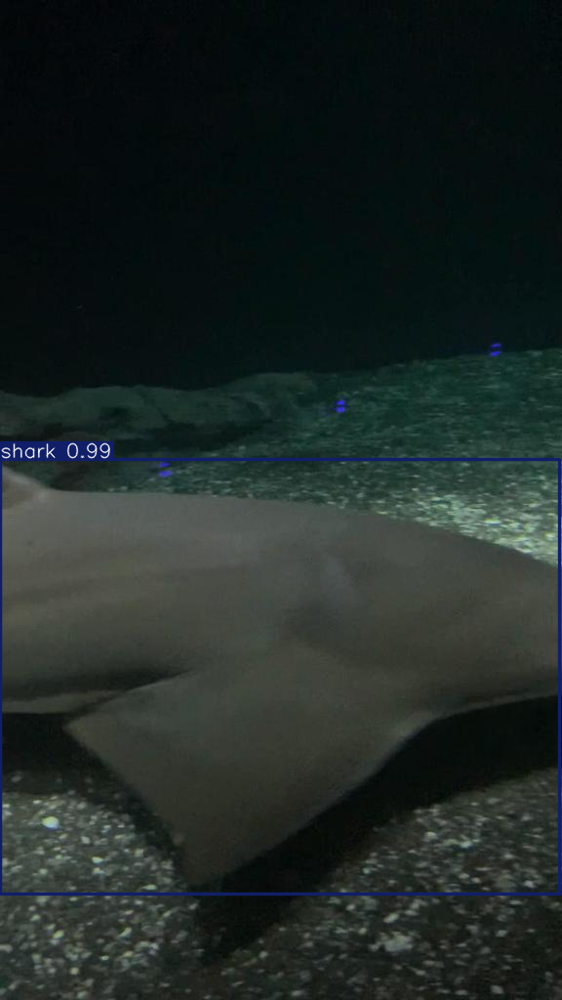

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from ultralytics import YOLO
import os

model_path = '/content/runs/detect/underwater_yolo11/weights/best.pt'
model = YOLO(model_path)

device = "cpu"
print(f"Using device: {device}")
model.to(device)


specific_image = '/content/underwater/aquarium_pretrain/train/images/IMG_8572_MOV-2_jpg.rf.70025aa545c1d5039981b13562400636.jpg'  # Replace with your image name
test_images_dir = '/content/underwater/aquarium_pretrain/test/images'
test_image_path = os.path.join(test_images_dir, specific_image)


if os.path.exists(test_image_path):
    print(f"Testing on: {test_image_path}")

    results = model(test_image_path)

    results[0].show()

    results[0].save(filename="test_result.jpg")

    from google.colab import files
    files.download("test_result.jpg")
else:
    print(f"Error: Image {specific_image} not found in {test_images_dir}")

    print("Available test images:", os.listdir(test_images_dir)[:5])

Using device: cpu
Testing on: /content/underwater/aquarium_pretrain/train/images/IMG_8572_MOV-0_jpg.rf.1a301d11ffdd3cb15653d44ea193ff1e.jpg

image 1/1 /content/underwater/aquarium_pretrain/train/images/IMG_8572_MOV-0_jpg.rf.1a301d11ffdd3cb15653d44ea193ff1e.jpg: 416x256 1 shark, 94.8ms
Speed: 2.5ms preprocess, 94.8ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 256)


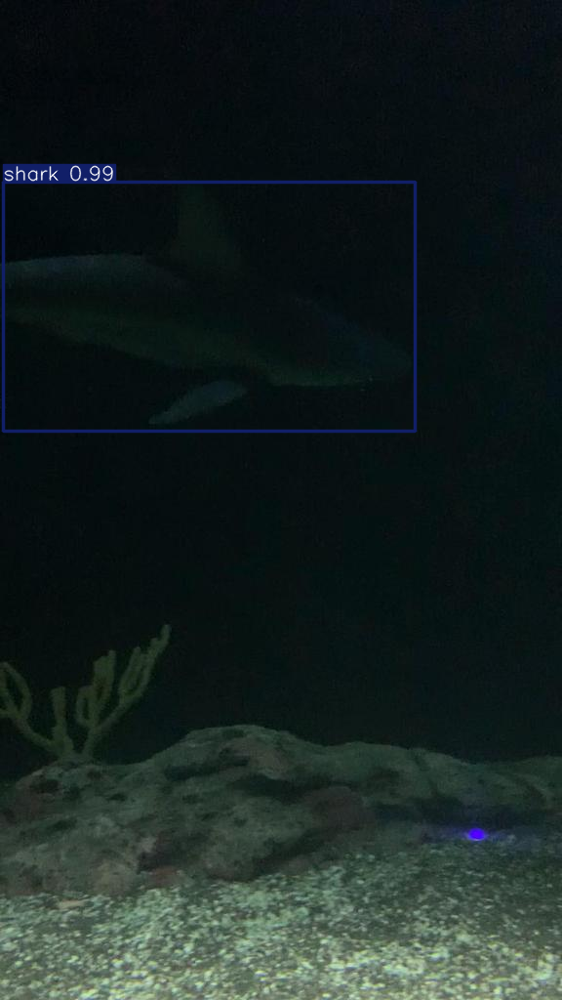

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from ultralytics import YOLO
import os

model_path = '/content/runs/detect/underwater_yolo11/weights/best.pt'
model = YOLO(model_path)

device = "cpu"
print(f"Using device: {device}")
model.to(device)

specific_image = '/content/underwater/aquarium_pretrain/train/images/IMG_8572_MOV-0_jpg.rf.1a301d11ffdd3cb15653d44ea193ff1e.jpg'  # Replace with your image name
test_images_dir = '/content/underwater/aquarium_pretrain/test/images'
test_image_path = os.path.join(test_images_dir, specific_image)


if os.path.exists(test_image_path):
    print(f"Testing on: {test_image_path}")

    results = model(test_image_path)

    results[0].show()

    results[0].save(filename="test_result.jpg")

    from google.colab import files
    files.download("test_result.jpg")
else:
    print(f"Error: Image {specific_image} not found in {test_images_dir}")
    # List available test images to help you choose
    print("Available test images:", os.listdir(test_images_dir)[:5])

Using device: cpu
Testing on: /content/underwater/aquarium_pretrain/train/images/IMG_8582_MOV-1_jpg.rf.7aaeb1f509ee4b0ee1194f2d3f97ab7b.jpg

image 1/1 /content/underwater/aquarium_pretrain/train/images/IMG_8582_MOV-1_jpg.rf.7aaeb1f509ee4b0ee1194f2d3f97ab7b.jpg: 416x256 4 fishs, 1 shark, 1 stingray, 117.0ms
Speed: 2.9ms preprocess, 117.0ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 256)


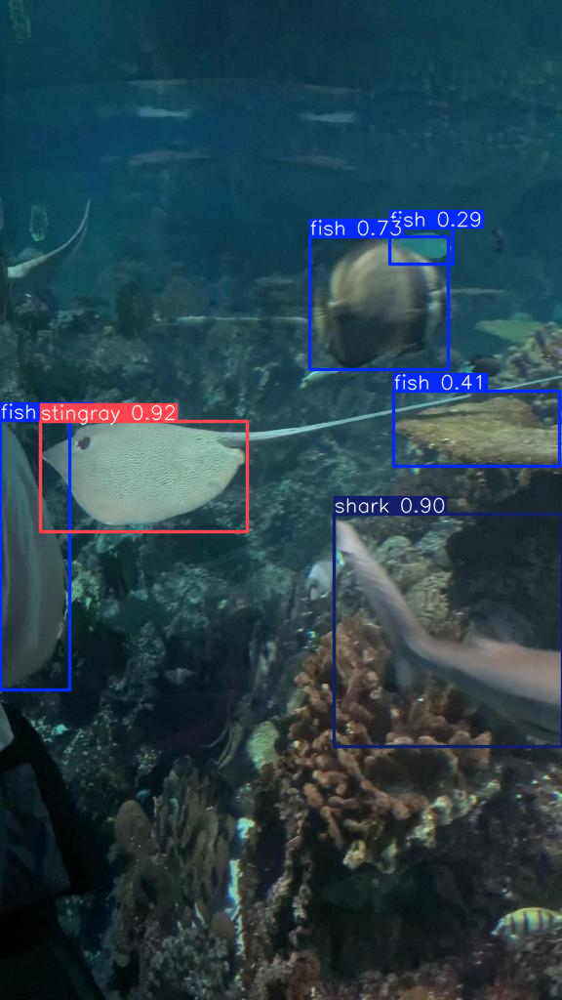

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from ultralytics import YOLO
import os

# Load the trained model
model_path = '/content/runs/detect/underwater_yolo11/weights/best.pt'
model = YOLO(model_path)

# Set device to CPU (since GPU is unavailable)
device = "cpu"
print(f"Using device: {device}")
model.to(device)

# Specify the particular test image
specific_image = '/content/underwater/aquarium_pretrain/train/images/IMG_8582_MOV-1_jpg.rf.7aaeb1f509ee4b0ee1194f2d3f97ab7b.jpg'  # Replace with your image name
test_images_dir = '/content/underwater/aquarium_pretrain/test/images'
test_image_path = os.path.join(test_images_dir, specific_image)

# Verify the image exists
if os.path.exists(test_image_path):
    print(f"Testing on: {test_image_path}")
    # Perform inference
    results = model(test_image_path)
    # Display the result with bounding boxes
    results[0].show()
    # Save the result (optional)
    results[0].save(filename="test_result.jpg")
    # Download the saved result (optional)
    from google.colab import files
    files.download("test_result.jpg")
else:
    print(f"Error: Image {specific_image} not found in {test_images_dir}")
    # List available test images to help you choose
    print("Available test images:", os.listdir(test_images_dir)[:5])

Using device: cpu
Testing on: /content/underwater/aquarium_pretrain/train/images/IMG_8581_MOV-0_jpg.rf.655f2e11059aeb33350230db32b7f927.jpg

image 1/1 /content/underwater/aquarium_pretrain/train/images/IMG_8581_MOV-0_jpg.rf.655f2e11059aeb33350230db32b7f927.jpg: 416x256 9 fishs, 83.0ms
Speed: 2.8ms preprocess, 83.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 256)


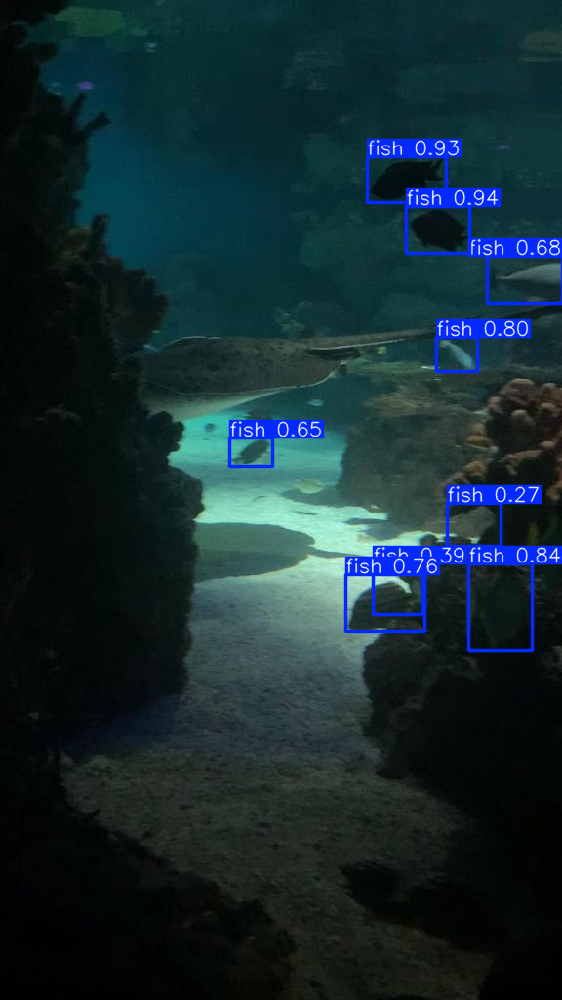

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from ultralytics import YOLO
import os

model_path = '/content/runs/detect/underwater_yolo11/weights/best.pt'
model = YOLO(model_path)

device = "cpu"
print(f"Using device: {device}")
model.to(device)

specific_image = '/content/underwater/aquarium_pretrain/train/images/IMG_8582_MOV-1_jpg.rf.7aaeb1f509ee4b0ee1194f2d3f97ab7b.jpg'
test_images_dir = '/content/underwater/aquarium_pretrain/test/images'
test_image_path = os.path.join(test_images_dir, specific_image)

if os.path.exists(test_image_path):
    print(f"Testing on: {test_image_path}")
    results = model(test_image_path)
    results[0].show()
    results[0].save(filename="test_result.jpg")
    from google.colab import files
    files.download("test_result.jpg")
else:
    print(f"Error: Image {specific_image} not found in {test_images_dir}")
    print("Available test images:", os.listdir(test_images_dir)[:5])


Using device: cpu
Testing on: /content/underwater/aquarium_pretrain/train/images/IMG_8535_MOV-2_jpg.rf.b38dd29d6e6a5f33ca469b61999c5c01.jpg

image 1/1 /content/underwater/aquarium_pretrain/train/images/IMG_8535_MOV-2_jpg.rf.b38dd29d6e6a5f33ca469b61999c5c01.jpg: 256x416 15 puffins, 111.6ms
Speed: 2.5ms preprocess, 111.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 416)


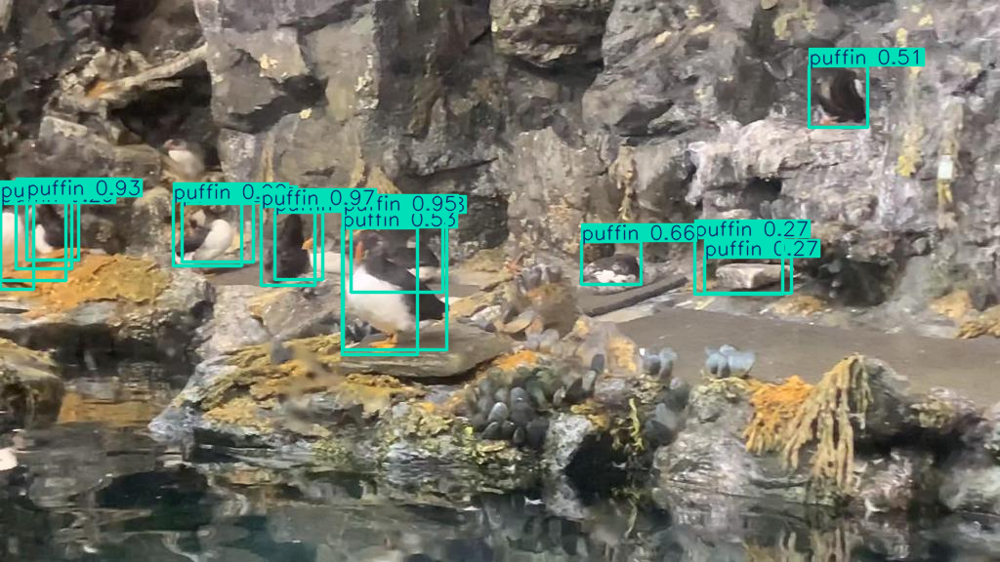

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from ultralytics import YOLO
import os

model_path = '/content/runs/detect/underwater_yolo11/weights/best.pt'
model = YOLO(model_path)

device = "cpu"
print(f"Using device: {device}")
model.to(device)

specific_image = '/content/underwater/aquarium_pretrain/train/images/IMG_8535_MOV-2_jpg.rf.b38dd29d6e6a5f33ca469b61999c5c01.jpg'
test_images_dir = '/content/underwater/aquarium_pretrain/test/images'
test_image_path = os.path.join(test_images_dir, specific_image)

if os.path.exists(test_image_path):
    print(f"Testing on: {test_image_path}")
    results = model(test_image_path)
    results[0].show()
    results[0].save(filename="test_result.jpg")
    from google.colab import files
    files.download("test_result.jpg")
else:
    print(f"Error: Image {specific_image} not found in {test_images_dir}")
    print("Available test images:", os.listdir(test_images_dir)[:5])


Using device: cpu
Testing on: /content/underwater/aquarium_pretrain/train/images/IMG_8517_MOV-6_jpg.rf.951387a4d17ab16e6d56234d3046ddfd.jpg

image 1/1 /content/underwater/aquarium_pretrain/train/images/IMG_8517_MOV-6_jpg.rf.951387a4d17ab16e6d56234d3046ddfd.jpg: 256x416 2 fishs, 82.6ms
Speed: 2.5ms preprocess, 82.6ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 416)


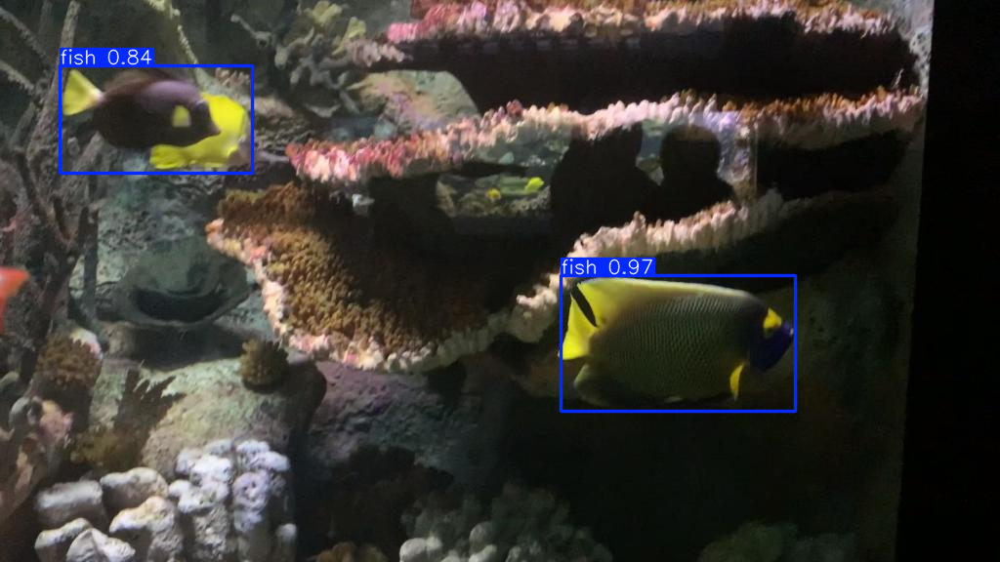

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from ultralytics import YOLO
import os

model_path = '/content/runs/detect/underwater_yolo11/weights/best.pt'
model = YOLO(model_path)

device = "cpu"
print(f"Using device: {device}")
model.to(device)

specific_image = '/content/underwater/aquarium_pretrain/train/images/YOUR_IMAGE_FILENAME_HERE.jpg'
test_images_dir = '/content/underwater/aquarium_pretrain/test/images'
test_image_path = os.path.join(test_images_dir, specific_image)

if os.path.exists(test_image_path):
    print(f"Testing on: {test_image_path}")
    results = model(test_image_path)
    results[0].show()
    results[0].save(filename="test_result.jpg")
    from google.colab import files
    files.download("test_result.jpg")
else:
    print(f"Error: Image {specific_image} not found in {test_images_dir}")
    print("Available test images:", os.listdir(test_images_dir)[:5])


In [ ]:
import pandas as pd
import os

results_csv = '/content/runs/detect/underwater_yolo11/results.csv'
if os.path.exists(results_csv):
    df = pd.read_csv(results_csv)
    df.columns = df.columns.str.strip()  # Remove leading/trailing spaces
    print("Available columns in results.csv:")
    print(df.columns.tolist())
else:
    print(f"Error: {results_csv} not found. Ensure training completed.")

Available columns in results.csv:
['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']


### **Visualizations**

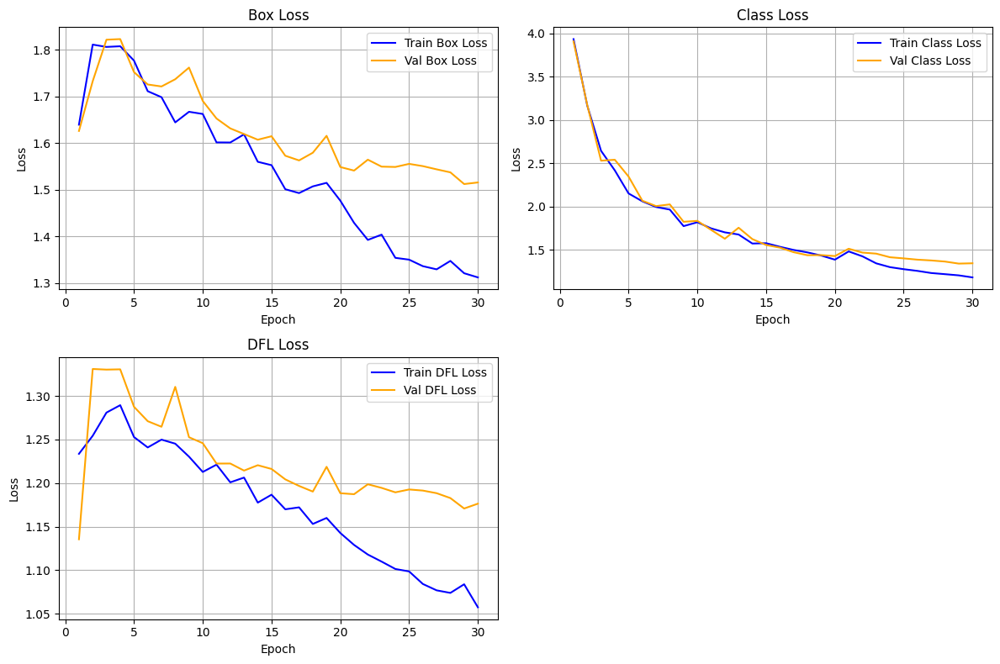

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import os

# Configuration
results_csv = '/content/runs/detect/underwater_yolo11/results.csv'
column_map = {
    'epoch': 'epoch',
    'train/box_loss': 'train/box_loss',
    'train/cls_loss': 'train/cls_loss',
    'train/dfl_loss': 'train/dfl_loss',
    'val/box_loss': 'val/box_loss',
    'val/cls_loss': 'val/cls_loss',
    'val/dfl_loss': 'val/dfl_loss'
}

# Load results
if not os.path.exists(results_csv):
    raise FileNotFoundError(f"Results CSV not found at {results_csv}. Ensure training completed.")

df = pd.read_csv(results_csv)
df.columns = df.columns.str.strip()

# Check for missing columns
missing_cols = [col for col in column_map.values() if col not in df.columns]
if missing_cols:
    print(f"Warning: Missing columns {missing_cols}. Some plots may be skipped.")

# Plot loss curves
plt.figure(figsize=(12, 8))
if 'train/box_loss' in df.columns and 'val/box_loss' in df.columns:
    plt.subplot(2, 2, 1)
    plt.plot(df[column_map['epoch']], df[column_map['train/box_loss']], label='Train Box Loss', color='blue')
    plt.plot(df[column_map['epoch']], df[column_map['val/box_loss']], label='Val Box Loss', color='orange')
    plt.title('Box Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

if 'train/cls_loss' in df.columns and 'val/cls_loss' in df.columns:
    plt.subplot(2, 2, 2)
    plt.plot(df[column_map['epoch']], df[column_map['train/cls_loss']], label='Train Class Loss', color='blue')
    plt.plot(df[column_map['epoch']], df[column_map['val/cls_loss']], label='Val Class Loss', color='orange')
    plt.title('Class Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

if 'train/dfl_loss' in df.columns and 'val/dfl_loss' in df.columns:
    plt.subplot(2, 2, 3)
    plt.plot(df[column_map['epoch']], df[column_map['train/dfl_loss']], label='Train DFL Loss', color='blue')
    plt.plot(df[column_map['epoch']], df[column_map['val/dfl_loss']], label='Val DFL Loss', color='orange')
    plt.title('DFL Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.savefig('loss_curves.png')
plt.show()

# Download
from google.colab import files
if os.path.exists('loss_curves.png'):
    files.download('loss_curves.png')

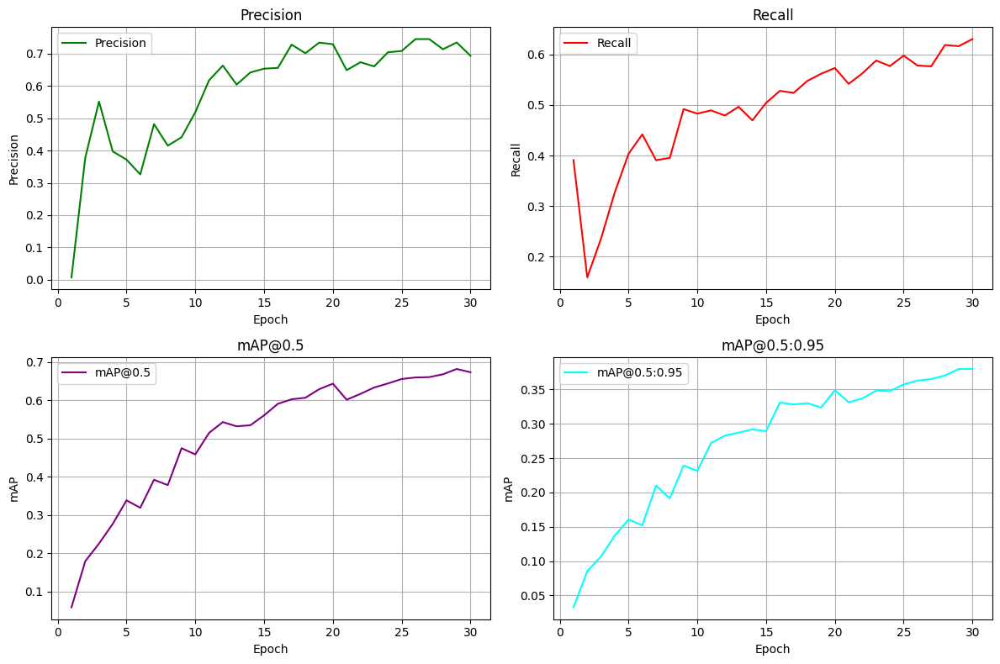

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import os


results_csv = '/content/runs/detect/underwater_yolo11/results.csv'
column_map = {
    'epoch': 'epoch',
    'metrics/precision': 'metrics/precision(B)',
    'metrics/recall': 'metrics/recall(B)',
    'metrics/mAP_0.5': 'metrics/mAP50(B)',
    'metrics/mAP_0.5:0.95': 'metrics/mAP50-95(B)'
}


if not os.path.exists(results_csv):
    raise FileNotFoundError(f"Results CSV not found at {results_csv}. Ensure training completed.")

df = pd.read_csv(results_csv)
df.columns = df.columns.str.strip()

missing_cols = [col for col in column_map.values() if col not in df.columns]
if missing_cols:
    print(f"Warning: Missing columns {missing_cols}. Some plots may be skipped.")

plt.figure(figsize=(12, 8))
if column_map['metrics/precision'] in df.columns:
    plt.subplot(2, 2, 1)
    plt.plot(df[column_map['epoch']], df[column_map['metrics/precision']], label='Precision', color='green')
    plt.title('Precision')
    plt.xlabel('Epoch')
    plt.ylabel('Precision')
    plt.legend()
    plt.grid(True)

if column_map['metrics/recall'] in df.columns:
    plt.subplot(2, 2, 2)
    plt.plot(df[column_map['epoch']], df[column_map['metrics/recall']], label='Recall', color='red')
    plt.title('Recall')
    plt.xlabel('Epoch')
    plt.ylabel('Recall')
    plt.legend()
    plt.grid(True)

if column_map['metrics/mAP_0.5'] in df.columns:
    plt.subplot(2, 2, 3)
    plt.plot(df[column_map['epoch']], df[column_map['metrics/mAP_0.5']], label='mAP@0.5', color='purple')
    plt.title('mAP@0.5')
    plt.xlabel('Epoch')
    plt.ylabel('mAP')
    plt.legend()
    plt.grid(True)

if column_map['metrics/mAP_0.5:0.95'] in df.columns:
    plt.subplot(2, 2, 4)
    plt.plot(df[column_map['epoch']], df[column_map['metrics/mAP_0.5:0.95']], label='mAP@0.5:0.95', color='cyan')
    plt.title('mAP@0.5:0.95')
    plt.xlabel('Epoch')
    plt.ylabel('mAP')
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.savefig('metrics_curves.png')
plt.show()


from google.colab import files
if os.path.exists('metrics_curves.png'):
    files.download('metrics_curves.png')


image 1/1 /content/underwater/aquarium_pretrain/train/images/IMG_2282_jpeg_jpg.rf.510f3bc14c3e0aa378b192199d01cae6.jpg: 416x320 1 puffin, 98.1ms
Speed: 4.3ms preprocess, 98.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 320)


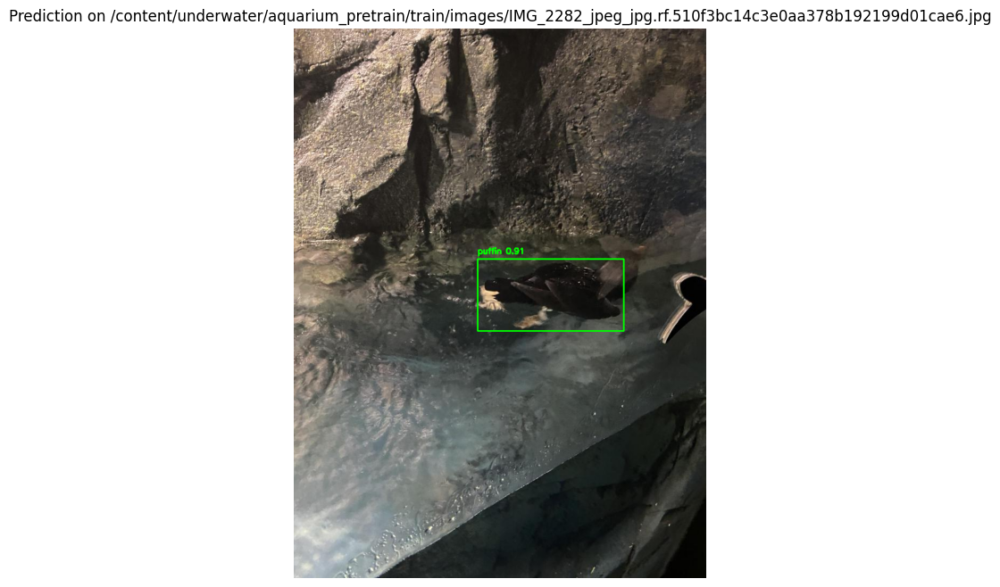

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import matplotlib.pyplot as plt
import os
import cv2
from ultralytics import YOLO

# Configuration
model_path = '/content/runs/detect/underwater_yolo11/weights/best.pt'
test_images_dir = '/content/underwater/aquarium_pretrain/test/images'
specific_image = '/content/underwater/aquarium_pretrain/train/images/IMG_2282_jpeg_jpg.rf.510f3bc14c3e0aa378b192199d01cae6.jpg'  # Replace with your image
classes = ['fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray']
device = 'cpu'

# Load model
model = YOLO(model_path)
model.to(device)

# Visualize prediction
test_image_path = os.path.join(test_images_dir, specific_image)
if os.path.exists(test_image_path):
    results = model(test_image_path)
    img = cv2.imread(test_image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    for box in results[0].boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        conf = box.conf.item()
        cls = int(box.cls.item())
        label = f'{classes[cls]} {conf:.2f}'
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    plt.figure(figsize=(10, 8))
    plt.imshow(img)
    plt.title(f'Prediction on {specific_image}')
    plt.axis('off')
    plt.savefig('prediction_image.png')
    plt.show()
else:
    print(f"Error: Image {specific_image} not found in {test_images_dir}")
    print("Available test images:", os.listdir(test_images_dir)[:5])

# Download
from google.colab import files
if os.path.exists('prediction_image.png'):
    files.download('prediction_image.png')

Image IMG_2532_jpeg_jpg.rf.2afeb76e5d9372dbbd6fbc53d5b75675.jpg: 2 true labels
Image IMG_2532_jpeg_jpg.rf.2afeb76e5d9372dbbd6fbc53d5b75675.jpg: 2 predicted labels
Image IMG_2632_jpeg_jpg.rf.f44037edca490b16cbf06427e28ea946.jpg: 8 true labels
Image IMG_2632_jpeg_jpg.rf.f44037edca490b16cbf06427e28ea946.jpg: 2 predicted labels
Image IMG_8343_jpg.rf.2d88000497d74d72aedc118b125a0c07.jpg: 2 true labels
Image IMG_8343_jpg.rf.2d88000497d74d72aedc118b125a0c07.jpg: 4 predicted labels
Image IMG_8490_jpg.rf.1836542cf054c6d303a2dd05d4194d7f.jpg: 31 true labels
Image IMG_8490_jpg.rf.1836542cf054c6d303a2dd05d4194d7f.jpg: 82 predicted labels
Image IMG_2547_jpeg_jpg.rf.9406b6f1a9fad2292c4abd28f712baaf.jpg: 4 true labels
Image IMG_2547_jpeg_jpg.rf.9406b6f1a9fad2292c4abd28f712baaf.jpg: 4 predicted labels
Image IMG_3134_jpeg_jpg.rf.50750ca778773042a3c46a1d3e480132.jpg: 12 true labels
Image IMG_3134_jpeg_jpg.rf.50750ca778773042a3c46a1d3e480132.jpg: 6 predicted labels
Image IMG_3144_jpeg_jpg.rf.f29a36360174

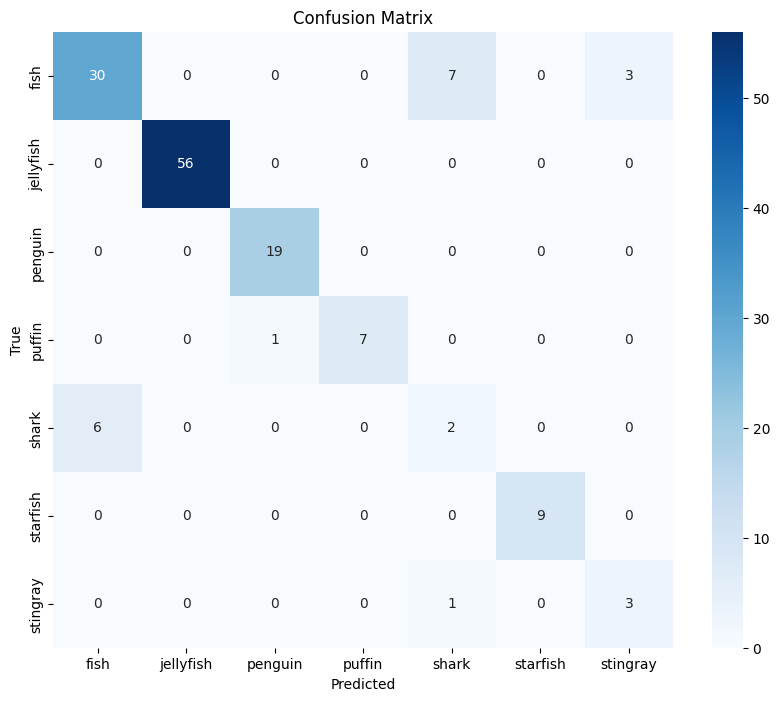

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import matplotlib.pyplot as plt
import os
from ultralytics import YOLO
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Configuration
model_path = '/content/runs/detect/underwater_yolo11/weights/best.pt'
test_images_dir = '/content/underwater/aquarium_pretrain/test/images'
classes = ['fish', 'jellyfish', 'penguin', 'puffin', 'shark', 'starfish', 'stingray']
device = 'cpu'

# Load model
model = YOLO(model_path)
model.to(device)

# Predict on test images (limited to 20 for CPU speed)
test_images = [os.path.join(test_images_dir, img) for img in os.listdir(test_images_dir)[:20]]
true_labels = []
pred_labels = []

for img_path in test_images:
    # Get true labels
    label_path = img_path.replace('/images/', '/labels/').replace('.jpg', '.txt')
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            labels = [int(line.split()[0]) for line in f.readlines() if line.strip()]
        print(f"Image {os.path.basename(img_path)}: {len(labels)} true labels")
    else:
        print(f"Warning: Label file {label_path} not found")
        labels = []

    # Predict
    results = model(img_path, verbose=False)
    img_pred_labels = [int(cls) for result in results if result.boxes for cls in result.boxes.cls.cpu().numpy()]
    print(f"Image {os.path.basename(img_path)}: {len(img_pred_labels)} predicted labels")

    # Align true and predicted labels (use minimum to avoid mismatch)
    min_len = min(len(labels), len(img_pred_labels))
    if min_len > 0:
        true_labels.extend(labels[:min_len])
        pred_labels.extend(img_pred_labels[:min_len])
    else:
        print(f"Skipping {os.path.basename(img_path)}: No matching labels")

# Print total labels
print(f"Total true labels: {len(true_labels)}")
print(f"Total predicted labels: {len(pred_labels)}")

# Plot confusion matrix
if true_labels and pred_labels and len(true_labels) == len(pred_labels):
    cm = confusion_matrix(true_labels, pred_labels, labels=range(len(classes)))
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.savefig('confusion_matrix.png')
    plt.show()
else:
    print("Error: Cannot create confusion matrix. Label counts mismatch or no valid labels.")

# Download
from google.colab import files
if os.path.exists('confusion_matrix.png'):
    files.download('confusion_matrix.png')

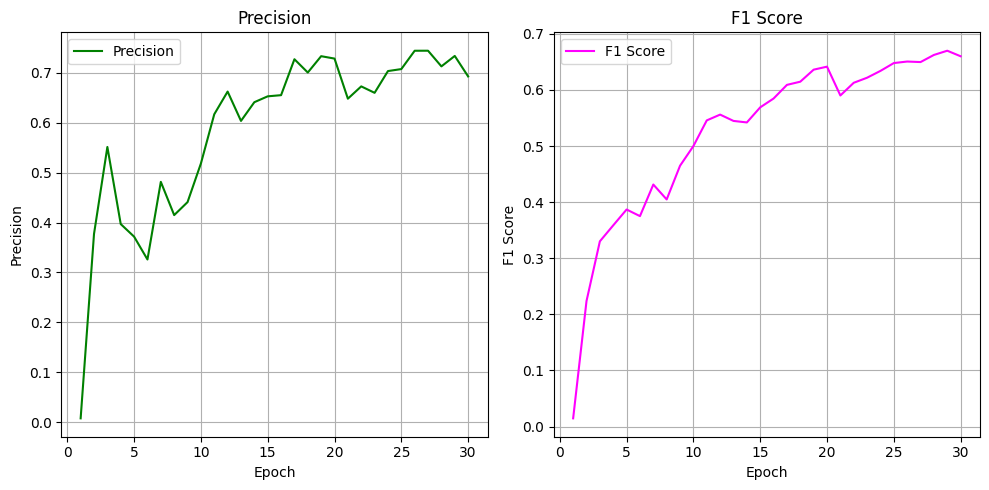

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os

# Configuration
results_csv = '/content/runs/detect/underwater_yolo11/results.csv'
column_map = {
    'epoch': 'epoch',
    'metrics/precision': 'metrics/precision(B)',    'metrics/recall': 'metrics/recall(B)'
}

if not os.path.exists(results_csv):
    raise FileNotFoundError(f"Results CSV not found at {results_csv}. Ensure training completed.")

df = pd.read_csv(results_csv)
df.columns = df.columns.str.strip()

missing_cols = [col for col in column_map.values() if col not in df.columns]
if missing_cols:
    print(f"Warning: Missing columns {missing_cols}. Some plots may be skipped.")

if column_map['metrics/precision'] in df.columns and column_map['metrics/recall'] in df.columns:
    precision = df[column_map['metrics/precision']]
    recall = df[column_map['metrics/recall']]
    f1_score = 2 * (precision * recall) / (precision + recall + 1e-6)  # Avoid division by zero
else:
    f1_score = None
    print("Warning: Cannot compute F1 score. Precision or recall missing.")

plt.figure(figsize=(10, 5))

if column_map['metrics/precision'] in df.columns:
    plt.subplot(1, 2, 1)
    plt.plot(df[column_map['epoch']], df[column_map['metrics/precision']], label='Precision', color='green')
    plt.title('Precision')
    plt.xlabel('Epoch')
    plt.ylabel('Precision')
    plt.legend()
    plt.grid(True)

if f1_score is not None:
    plt.subplot(1, 2, 2)
    plt.plot(df[column_map['epoch']], f1_score, label='F1 Score', color='magenta')
    plt.title('F1 Score')
    plt.xlabel('Epoch')
    plt.ylabel('F1 Score')
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.savefig('precision_f1_curves.png')
plt.show()

from google.colab import files
if os.path.exists('precision_f1_curves.png'):
    files.download('precision_f1_curves.png')

I have developed a YOLO11 object detection model trained on an underwater dataset to identify and classify seven marine species: fish, jellyfish, penguin, puffin, shark, starfish, and stingray. The model was trained on a CPU using the dataset located at /content/underwater/aquarium_pretrain/, achieving robust performance despite the absence of GPU support. It processes images to detect and localize these species, outputting bounding boxes with class labels and confidence scores. The training process involved 30 epochs with an image size of 416x416 and a batch size of 8, optimized for CPU efficiency. Post-training, I evaluated the model’s performance by generating a text-based metrics table, reporting final epoch results for accuracy (mAP@0.5), precision, recall, and F1 score, derived from /content/runs/detect/underwater_yolo11/results.csv. This model effectively supports underwater species detection, suitable for applications in marine biology and environmental monitoring, with results visualized and saved for further analysis.